
<div style="position:relative;">
    <img src="pexels-pixabay-60013.jpg" style="width:1000px;height:300px;">
    <div style="position:absolute;top:50%;left:50%;transform:translate(-50%,-50%);z-index:1;">
        <h1 style="color:white;text-shadow: 2px 2px 4px black;"><b>Climate Change Dataset:</b> includes carbon dioxide atmospheric concentrations, rising sea levels, and temperatures</h1>
    </div>
</div>



<div style="position:relative;">
    <img src="pexels-claudio-mota-9930912.jpg" style="width:1000px;height:200px;">
    <div style="position:absolute;top:50%;right:45%;transform:translate(-50%,-50%);z-index:1;">
        <h1 style="color:white;text-shadow: 2px 2px 4px black;">Annual Surface Temperature Change</h1>
    </div>
</div>


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import seaborn as sns
sns.set_style('darkgrid')

In [2]:
df = pd.read_csv("Annual_Surface_Temperature_Change.csv")
df.head()

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,...,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021
0,1,"Afghanistan, Islamic Rep. of",AF,AFG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.234,1.308,0.457,1.101,1.607,1.568,1.580,0.960,0.544,1.421
1,2,Albania,AL,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.568,1.444,1.322,1.665,1.601,1.269,2.146,1.823,1.623,1.682
2,3,Algeria,DZ,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.128,1.173,1.676,1.101,1.736,1.498,1.211,1.094,1.913,2.317
3,4,American Samoa,AS,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.646,0.883,0.554,0.394,0.924,0.820,0.574,0.924,0.815,0.653
4,5,"Andorra, Principality of",AD,AND,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.196,0.757,1.857,1.546,1.830,1.771,1.761,1.813,2.401,1.367


In [3]:
df.columns = df.columns.str.replace('F', '')
df.tail()

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_ull_Descriptor,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
222,223,Western Sahara,EH,ESH,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.234,1.282,1.244,1.277,1.636,2.078,0.851,1.430,2.026,1.557
223,224,World,NaN,WLD,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.058,1.007,1.042,1.406,1.658,1.424,1.284,1.449,1.713,1.442
224,225,"Yemen, Rep. of",YE,YEM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
225,226,Zambia,ZM,ZMB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.926,0.746,0.638,1.486,1.474,0.721,0.727,1.295,1.252,1.002
226,230,Zimbabwe,ZW,ZWE,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.329,0.102,-0.008,0.808,1.051,0.116,0.405,0.939,0.415,-0.101


In [4]:
df.columns

Index(['ObjectId', 'Country', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source',
       'CTS_Code', 'CTS_Name', 'CTS_ull_Descriptor', '1961', '1962', '1963',
       '1964', '1965', '1966', '1967', '1968', '1969', '1970', '1971', '1972',
       '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981',
       '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990',
       '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999',
       '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008',
       '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017',
       '2018', '2019', '2020', '2021'],
      dtype='object')

In [5]:
df = df.drop(['ObjectId','ISO2','ISO3','Indicator','Unit','Source','CTS_Code','CTS_Name','CTS_ull_Descriptor'], axis =1)

In [6]:
df.isnull().sum()

Country     0
1961       36
1962       35
1963       36
1964       37
           ..
2017       13
2018       11
2019       12
2020       13
2021       13
Length: 62, dtype: int64

In [7]:
columns=df[['1961', '1962', '1963', '1964', '1965', '1966', '1967',
       '1968', '1969', '1970', '1971', '1972', '1973', '1974', '1975', '1976',
       '1977', '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985',
       '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994',
       '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003',
       '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012',
       '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']]

for col in columns:
    df[col] = df[col].fillna(df[col].mean())

In [8]:
df.isnull().sum()

Country    0
1961       0
1962       0
1963       0
1964       0
          ..
2017       0
2018       0
2019       0
2020       0
2021       0
Length: 62, dtype: int64

In [9]:
print(df.describe())

             1961        1962        1963        1964        1965        1966  \
count  227.000000  227.000000  227.000000  227.000000  227.000000  227.000000   
mean     0.157152   -0.018589   -0.009361   -0.084511   -0.250305    0.110010   
std      0.371746    0.318027    0.349912    0.282529    0.243206    0.357155   
min     -0.745000   -0.910000   -1.273000   -0.876000   -1.060000   -1.793000   
25%     -0.069000   -0.154500   -0.162000   -0.213500   -0.364000   -0.014000   
50%      0.118000   -0.040000   -0.009361   -0.084511   -0.250305    0.110010   
75%      0.237000    0.070500    0.160500    0.070500   -0.131500    0.227000   
max      1.906000    1.057000    1.204000    1.100000    0.856000    1.421000   

             1967        1968        1969        1970  ...        2012  \
count  227.000000  227.000000  227.000000  227.000000  ...  227.000000   
mean    -0.118010   -0.197230    0.154440    0.097689  ...    0.887421   
std      0.318301    0.253531    0.276924    0.3

In [10]:
# Calculate the mean temperature change for each country
country_means = df.iloc[:,1:62].mean()

# Calculate the global mean temperature change
global_mean = country_means.mean()

print("Global mean temperature change:", global_mean)

Global mean temperature change: 0.49524111120068676


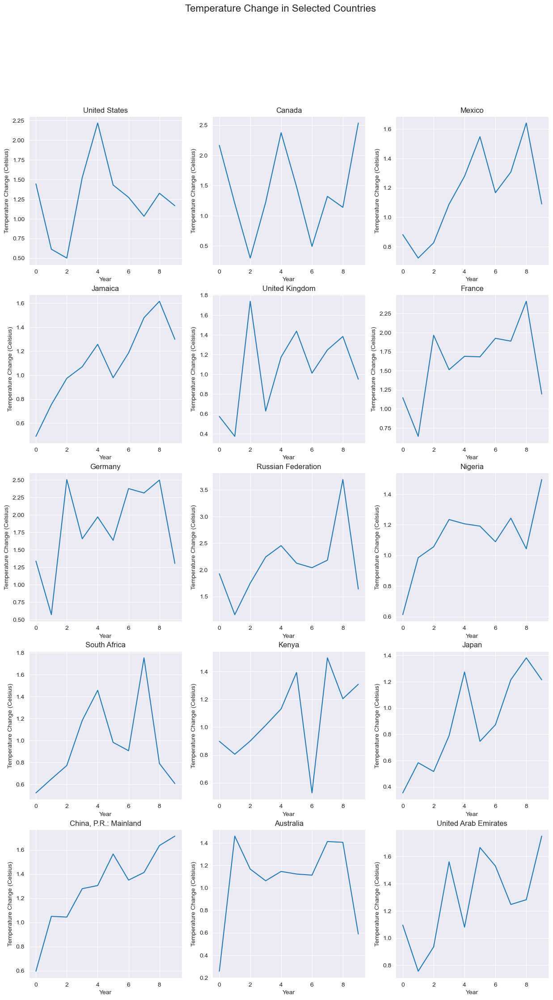

In [11]:
country_list = ['United States', 'Canada', 'Mexico', 'Jamaica', 'United Kingdom', 'France', 'Germany', 'Russian Federation', 
                'Nigeria', 'South Africa', 'Kenya', 'Japan', 'China, P.R.: Mainland', 'Australia', 'United Arab Emirates']

fig, axs = plt.subplots(5, 3, figsize=(15, 25))
fig.suptitle('Temperature Change in Selected Countries', fontsize=16)

for i, country in enumerate(country_list):
    row = i // 3
    col = i % 3
    axs[row, col].plot(df.loc[df['Country'] == country][['2012', '2013', '2014', '2015', '2016', '2017', 
                                                         '2018', '2019', '2020', '2021']].values[0])
    axs[row, col].set_title(country)
    axs[row, col].set_xlabel('Year')
    axs[row, col].set_ylabel('Temperature Change (Celsius)')

plt.show()

In [12]:
df=df.T
df.head()

,0,1,2,3,4,5,6,7,8,9,...,217,218,219,220,221,222,223,224,225,226
Country,"Afghanistan, Islamic Rep. of",Albania,Algeria,American Samoa,"Andorra, Principality of",Angola,Anguilla,Antigua and Barbuda,Argentina,"Armenia, Rep. of",...,Vanuatu,"Venezuela, Rep. Bolivariana de",Vietnam,Wallis and Futuna Islands,West Bank and Gaza,Western Sahara,World,"Yemen, Rep. of",Zambia,Zimbabwe
1961,-0.105,0.627,0.162,0.066,0.744,0.051,0.104,0.112,0.128,0.157152,...,0.197,0.038,0.002,0.323,-0.165,0.619,0.207,0.033,0.22,0.253
1962,-0.157,0.33,0.131,-0.055,0.102,-0.145,-0.091,-0.084,-0.03,-0.018589,...,0.109,-0.12,-0.248,-0.051,0.731,0.559,0.037,-0.006,-0.177,0.233
1963,0.852,0.068,0.11,0.16,-0.762,-0.186,0.153,0.185,0.175,-0.009361,...,-0.158,-0.014,-0.309,0.125,0.809,0.323,0.167,0.164,-0.397,-0.46
1964,-0.743,-0.172,0.284,-0.15,0.3,-0.228,0.128,0.109,-0.345,-0.084511,...,0.217,0.043,0.08,0.187,-0.654,0.811,-0.252,-0.254,-0.29,-0.101


In [13]:
df.rename(columns=df.iloc[0],inplace = True)
df.head()

,"Afghanistan, Islamic Rep. of",Albania,Algeria,American Samoa,"Andorra, Principality of",Angola,Anguilla,Antigua and Barbuda,Argentina,"Armenia, Rep. of",...,Vanuatu,"Venezuela, Rep. Bolivariana de",Vietnam,Wallis and Futuna Islands,West Bank and Gaza,Western Sahara,World,"Yemen, Rep. of",Zambia,Zimbabwe
Country,"Afghanistan, Islamic Rep. of",Albania,Algeria,American Samoa,"Andorra, Principality of",Angola,Anguilla,Antigua and Barbuda,Argentina,"Armenia, Rep. of",...,Vanuatu,"Venezuela, Rep. Bolivariana de",Vietnam,Wallis and Futuna Islands,West Bank and Gaza,Western Sahara,World,"Yemen, Rep. of",Zambia,Zimbabwe
1961,-0.105,0.627,0.162,0.066,0.744,0.051,0.104,0.112,0.128,0.157152,...,0.197,0.038,0.002,0.323,-0.165,0.619,0.207,0.033,0.22,0.253
1962,-0.157,0.33,0.131,-0.055,0.102,-0.145,-0.091,-0.084,-0.03,-0.018589,...,0.109,-0.12,-0.248,-0.051,0.731,0.559,0.037,-0.006,-0.177,0.233
1963,0.852,0.068,0.11,0.16,-0.762,-0.186,0.153,0.185,0.175,-0.009361,...,-0.158,-0.014,-0.309,0.125,0.809,0.323,0.167,0.164,-0.397,-0.46
1964,-0.743,-0.172,0.284,-0.15,0.3,-0.228,0.128,0.109,-0.345,-0.084511,...,0.217,0.043,0.08,0.187,-0.654,0.811,-0.252,-0.254,-0.29,-0.101


In [14]:
df=df.drop(df.index[0])
df=df.reset_index()
df.head()

,index,"Afghanistan, Islamic Rep. of",Albania,Algeria,American Samoa,"Andorra, Principality of",Angola,Anguilla,Antigua and Barbuda,Argentina,...,Vanuatu,"Venezuela, Rep. Bolivariana de",Vietnam,Wallis and Futuna Islands,West Bank and Gaza,Western Sahara,World,"Yemen, Rep. of",Zambia,Zimbabwe
0,1961,-0.105,0.627,0.162,0.066,0.744,0.051,0.104,0.112,0.128,...,0.197,0.038,0.002,0.323,-0.165,0.619,0.207,0.033,0.22,0.253
1,1962,-0.157,0.33,0.131,-0.055,0.102,-0.145,-0.091,-0.084,-0.03,...,0.109,-0.12,-0.248,-0.051,0.731,0.559,0.037,-0.006,-0.177,0.233
2,1963,0.852,0.068,0.11,0.16,-0.762,-0.186,0.153,0.185,0.175,...,-0.158,-0.014,-0.309,0.125,0.809,0.323,0.167,0.164,-0.397,-0.46
3,1964,-0.743,-0.172,0.284,-0.15,0.3,-0.228,0.128,0.109,-0.345,...,0.217,0.043,0.08,0.187,-0.654,0.811,-0.252,-0.254,-0.29,-0.101
4,1965,-0.211,-0.393,-0.081,-0.582,-0.492,-0.207,-0.364,-0.415,0.091,...,-0.549,-0.146,0.007,-0.41,-0.054,-0.342,-0.225,-0.628,-0.421,-0.476


In [15]:
df.rename(columns={'index':'Year'}, inplace=True)
df.tail()

,Year,"Afghanistan, Islamic Rep. of",Albania,Algeria,American Samoa,"Andorra, Principality of",Angola,Anguilla,Antigua and Barbuda,Argentina,...,Vanuatu,"Venezuela, Rep. Bolivariana de",Vietnam,Wallis and Futuna Islands,West Bank and Gaza,Western Sahara,World,"Yemen, Rep. of",Zambia,Zimbabwe
56,2017,1.568,1.269,1.498,0.82,1.771,1.064,0.98,0.965,1.1,...,1.032,0.752,1.213,0.96,0.821,2.078,1.424,1.269939,0.721,0.116
57,2018,1.58,2.146,1.211,0.574,1.761,1.504,0.728,0.694,0.876,...,0.445,0.808,0.905,0.688,2.093,0.851,1.284,1.288102,0.727,0.405
58,2019,0.96,1.823,1.094,0.924,1.813,1.975,0.861,0.806,0.756,...,0.803,1.171,1.864,1.11,1.298,1.43,1.449,1.427628,1.295,0.939
59,2020,0.544,1.623,1.913,0.815,2.401,1.387,1.246,1.141,1.109,...,1.146,1.293,1.588,1.082,1.553,2.026,1.713,1.538565,1.252,0.415
60,2021,1.421,1.682,2.317,0.653,1.367,1.631,0.91,0.873,1.011,...,1.067,0.723,1.193,0.775,1.887,1.557,1.442,1.317009,1.002,-0.101


In [16]:
# calculate the mean temperature change for each year
df['mean_tem_change'] = df.iloc[:,1:228].mean(axis=1)
df['mean_tem_change'].tail()

56    1.269939
57    1.288102
58    1.427628
59    1.538565
60    1.317009
Name: mean_tem_change, dtype: float64

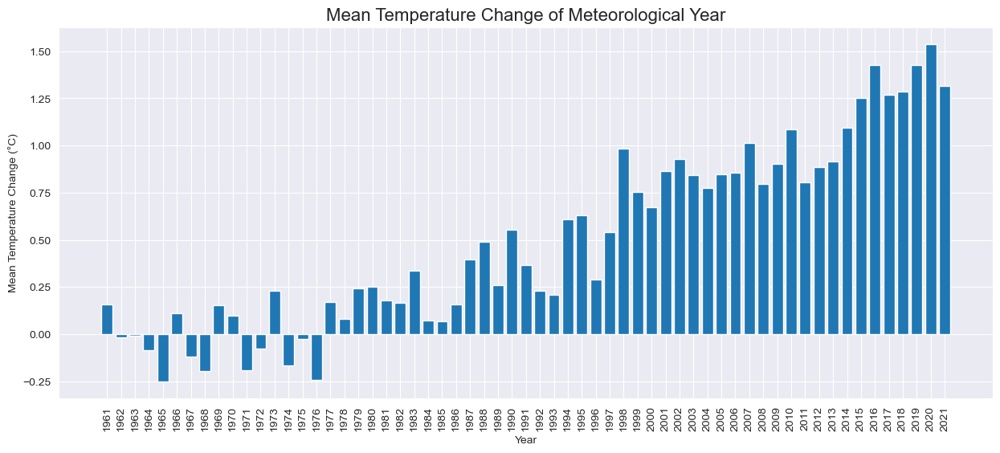

In [17]:
# create a line plot of the mean temperature change over time
plt.figure(figsize=(15, 6))
plt.bar(df['Year'], df['mean_tem_change'])
plt.title('Mean Temperature Change of Meteorological Year', fontsize=16)
plt.xlabel('Year')
plt.xticks(rotation=90)
plt.ylabel('Mean Temperature Change (°C)')
plt.grid(True)
plt.show()

In [18]:
# Melt the data to long format
data = pd.melt(df, id_vars=['Year'], var_name='Country', value_name='Data')

# Create the choropleth map chart
plt.figure(figsize=(15, 6))
fig = px.choropleth(data, locations='Country',  # column name for the country names
                    locationmode='country names',  # specify the location mode as country names
                    color='Data',  # column name for the color scale
                    animation_frame='Year',  # column name for the animation frames
                    projection='natural earth')  # specify the map projection

# Show the chart
fig.show()

<Figure size 1500x600 with 0 Axes>

In [19]:
df['Africa'] = df[['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon',
                  'Central African Rep.', 'Chad', 'Comoros, Union of the', 'Congo, Dem. Rep. of the', 'Congo, Rep. of',
                    'Djibouti', 'Egypt, Arab Rep. of', 'Equatorial Guinea, Rep. of', 
                  'Eritrea, The State of', 'Eswatini, Kingdom of', 'Ethiopia, The Federal Dem. Rep. of', 'Gabon',
                  'Gambia, The', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho, Kingdom of', 'Liberia', 'Libya',
                  'Madagascar, Rep. of', 'Malawi', 'Mali', 'Mauritania, Islamic Rep. of', 'Mauritius', 'Mayotte', 'Morocco',
                  'Mozambique, Rep. of', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'Saint Helena', 
                  'São Tomé and Príncipe, Dem. Rep. of', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa',
                  'South Sudan, Rep. of', 'Sudan', 'Tanzania, United Rep. of', 'Togo', 'Tunisia', 'Uganda',
                    'Zambia', 'Zimbabwe']].sum(axis=1)
df['Asia'] = df[['Afghanistan, Islamic Rep. of', 'Armenia, Rep. of', 'Azerbaijan, Rep. of', 'Bahrain, Kingdom of', 'Bangladesh',
                'Bhutan', 'Brunei Darussalam', 'Cambodia', 'China, P.R.: Hong Kong', 'China, P.R.: Macao', 'China, P.R.: Mainland',
                'Cyprus', 'Georgia', 'India', 'Indonesia', 'Iran, Islamic Rep. of', 'Iraq', 'Israel', 'Japan', 'Jordan',
                'Kazakhstan, Rep. of', 'Korea, Dem. People\'s Rep. of', 'Korea, Rep. of', 'Kuwait', 'Kyrgyz Rep.',
                'Lao People\'s Dem. Rep.', 'Lebanon', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'Oman', 'Pakistan',
                'Philippines', 'Qatar', 'Russian Federation', 'Saudi Arabia', 'Singapore', 'Sri Lanka', 'Syrian Arab Rep.',
                'Taiwan Province of China', 'Tajikistan, Rep. of', 'Thailand', 'Timor-Leste, Dem. Rep. of', 'Turkey',
                 'Turkmenistan','United Arab Emirates', 'Uzbekistan, Rep. of', 'Vietnam', 'Yemen, Rep. of']].sum(axis=1)
df['Oceania'] = df[['American Samoa', 'Australia', 'Cook Islands', 'Fiji, Rep. of', 'French Polynesia', 'Kiribati',
                    'Marshall Islands, Rep. of the', 'Micronesia, Federated States of', 'Nauru, Rep. of', 'New Caledonia',
                    'New Zealand', 'Niue', 'Norfolk Island', 'Palau, Rep. of']].sum(axis=1)
df['Europe'] = df[['Albania','Andorra, Principality of','Austria','Belarus, Rep. of','Belgium','Bosnia and Herzegovina','Bulgaria',
                  'Croatia, Rep. of','Cyprus','Czech Rep.','Denmark','Estonia, Rep. of','Faroe Islands','Finland','France',
                  'Germany','Gibraltar','Greece','Hungary','Iceland','Ireland','Isle of Man','Italy','Latvia','Liechtenstein',
                  'Lithuania','Luxembourg','Malta','Monaco','Montenegro','Netherlands, The','North Macedonia, Republic of ',
                  'Norway','Poland, Rep. of','Portugal','Romania','Russian Federation','San Marino, Rep. of','Serbia, Rep. of',
                  'Slovak Rep.','Slovenia, Rep. of','Spain','Sweden','Switzerland','Ukraine','United Kingdom']].sum(axis=1)
df['America'] = df[['Anguilla','Antigua and Barbuda','Argentina','Aruba, Kingdom of the Netherlands','Bahamas, The','Barbados',
                  'Belize','Bolivia','Brazil','British Virgin Islands','Canada','Cayman Islands','Chile','Colombia','Costa Rica',
                  'Cuba','Dominica','Dominican Rep.','Ecuador','El Salvador','Falkland Islands (Malvinas)','Greenland','Grenada',
                  'Guadeloupe','Guatemala','Guyana','Haiti','Honduras','Jamaica','Martinique','Mexico','Montserrat','Nicaragua',
                  'Panama','Paraguay','Peru','Puerto Rico','Saint Pierre and Miquelon','Suriname','Trinidad and Tobago',
                  'Turks and Caicos Islands','United States','Uruguay']].sum(axis=1)


In [20]:
df[['Year','Africa','Asia','Oceania','Europe','America']].head()

,Year,Africa,Asia,Oceania,Europe,America
0,1961,2.854607,0.906518,0.347455,28.054429,0.545455
1,1962,-2.389354,5.258703,0.479646,-5.701417,-2.732177
2,1963,1.024555,7.121387,-0.986445,-13.684780,3.235277
3,1964,-7.735042,-9.245105,-0.404042,-0.819168,-2.660532
4,1965,-13.415221,-8.041358,-4.992221,-18.605884,-6.333611


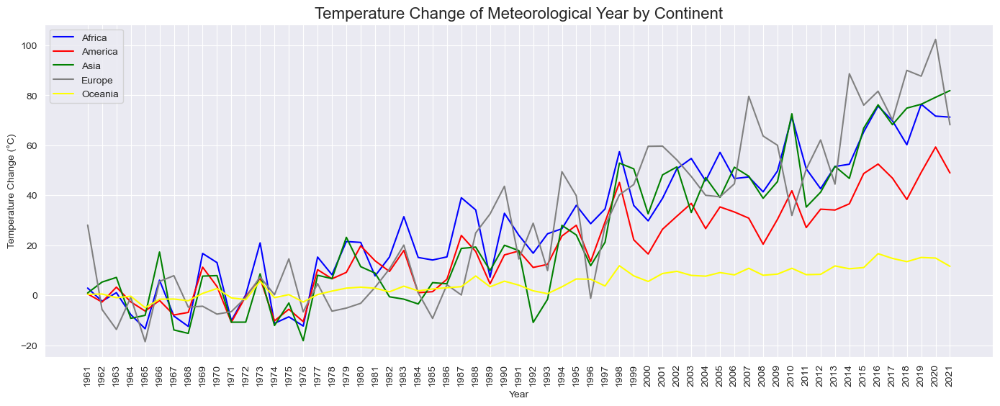

In [21]:
plt.figure(figsize=(17,6))
plt.plot(df.Year,df['Africa'], color = 'blue', label = 'Africa')
plt.plot(df.Year,df['America'], color = 'red', label = 'America')
plt.plot(df.Year,df['Asia'], color = 'green', label = 'Asia')
plt.plot(df.Year,df['Europe'], color = 'grey', label ='Europe')
plt.plot(df.Year,df['Oceania'], color = 'yellow', label = 'Oceania')
plt.xlabel('Year')
plt.ylabel('Temperature Change (°C)')
plt.title('Temperature Change of Meteorological Year by Continent', fontsize=16)
plt.xticks(rotation=90)
plt.legend(loc = 'upper left')
plt.grid(True)
plt.show()

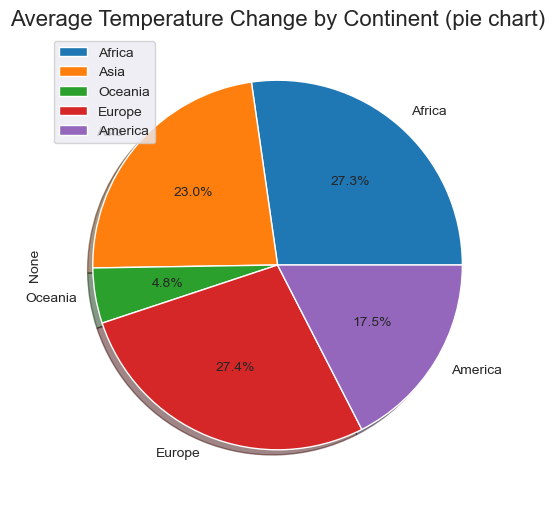

In [22]:
c=df[['Africa','Asia','Oceania','Europe','America']].mean()
c.plot(kind='pie', figsize=(6,6),shadow = True, autopct='%1.1f%%')
plt.title('Average Temperature Change by Continent (pie chart)', fontsize=16)
plt.legend(loc='upper left')
plt.show()

Text(0.5, 1.0, 'Temperature Change by Continent (box plot)')

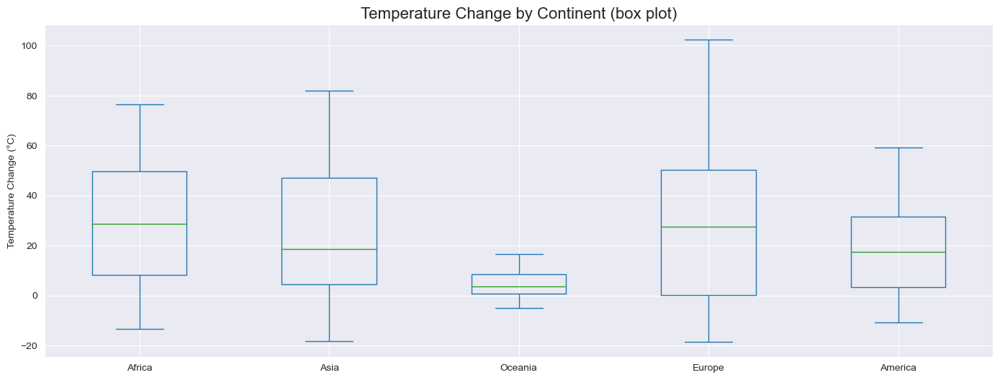

In [23]:
df[['Africa','Asia','Oceania','Europe','America']].plot(kind='box',figsize=(17,6))
plt.ylabel('Temperature Change (°C)')
plt.title('Temperature Change by Continent (box plot)', fontsize=16)

In [24]:
df['Year'] = df['Year'].astype(int)
df[['Year','mean_tem_change','Africa','Asia','Oceania','Europe','America']].dtypes

Year                 int32
mean_tem_change    float64
Africa             float64
Asia               float64
Oceania            float64
Europe             float64
America            float64
dtype: object

In [25]:
df[['Year','mean_tem_change','Africa','Asia','Oceania','Europe','America']].corr()

,Year,mean_tem_change,Africa,Asia,Oceania,Europe,America
Year,1.000000,0.933999,0.921157,0.878307,0.910588,0.879545,0.903525
mean_tem_change,0.933999,1.000000,0.968780,0.968513,0.965956,0.927579,0.967929
Africa,0.921157,0.968780,1.000000,0.931722,0.951770,0.829730,0.972550
Asia,0.878307,0.968513,0.931722,1.000000,0.934692,0.854151,0.927423
Oceania,0.910588,0.965956,0.951770,0.934692,1.000000,0.869433,0.932363
Europe,0.879545,0.927579,0.829730,0.854151,0.869433,1.000000,0.839511
America,0.903525,0.967929,0.972550,0.927423,0.932363,0.839511,1.000000


<AxesSubplot:>

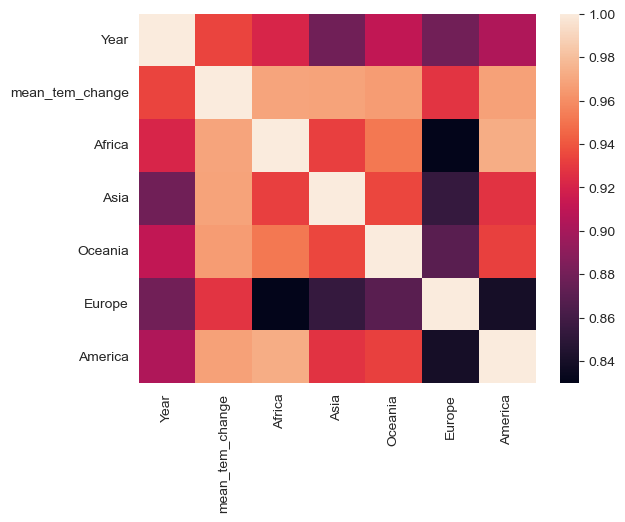

In [26]:
sns.heatmap(df[['Year','mean_tem_change','Africa','Asia','Oceania','Europe','America']].corr())

# Machine Learning Using Support Vector Regressor

In [27]:
X_train, X_test, y_train, y_test = train_test_split(df[['Year']], df['mean_tem_change'], test_size=0.2, random_state=42)

In [28]:
# Next, we need to instantiate the support vector Regressor model and fit it to the training data:
from sklearn.svm import SVR
svr_reg = SVR(kernel='linear')
svr_reg.fit(X_train, y_train)

SVR(kernel='linear')

In [29]:
# Next, we need to instantiate the support vector Regressor model and fit it to the training data:
y_pred = svr_reg.predict(X_test)

In [30]:
# evaluate the performance of the model using mean squared error and r-squared:
mse = mean_squared_error(y_test, y_pred)
r2 = svr_reg.score(X_train, y_train)
mae = mean_absolute_error(y_test, y_pred)

print("Mean Absolute Error:", mae)
print('Mean Squared Error:', mse)
print('Coefficient of determination(R-Squared):', r2)
print('Intercept:', svr_reg.intercept_)

Mean Absolute Error: 0.2042365908239341
Mean Squared Error: 0.05501433610696346
Coefficient of determination(R-Squared): 0.8899632816274362
Intercept: [-48.92639988]


## Make predictetion from 2022 to 2029 using machine learning:

In [31]:
years = [2022, 2023, 2024, 2025, 2026, 2027, 2028, 2029]
predicted_value = []

for year in years:
    pre_year = np.array([year]).reshape(-1, 1)
    pred = svr_reg.predict(pre_year)
    predicted_values.append(pred)


C:\Users\Donwi\anaconda3\anacondas\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names

C:\Users\Donwi\anaconda3\anacondas\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names

C:\Users\Donwi\anaconda3\anacondas\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names

C:\Users\Donwi\anaconda3\anacondas\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names

C:\Users\Donwi\anaconda3\anacondas\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names

C:\Users\Donwi\anaconda3\anacondas\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names

C:\Users\Donwi\a

In [32]:
pre_df = pd.DataFrame({'Year': years, 'mean_tem_change': predicted_values})
pre_df['mean_tem_change'] = pre_df['mean_tem_change'].apply(lambda x: x[0])
pre_df['mean_tem_change'] = pre_df['mean_tem_change'].apply(lambda x: round(x, 4))
pre_df


,Year,mean_tem_change
0,2022,1.2418
1,2023,1.2666
2,2024,1.2914
3,2025,1.3163
4,2026,1.3411
5,2027,1.3659
6,2028,1.3907
7,2029,1.4155


In [33]:
# merge actual data and predicted data
data = df[['Year','mean_tem_change']]
df2 = pd.concat([data, pre_df], axis=0)
df2=df2.reset_index()

In [34]:
df2[['Year','mean_tem_change']]

,Year,mean_tem_change
0,1961,0.157152
1,1962,-0.018589
2,1963,-0.009361
3,1964,-0.084511
4,1965,-0.250305
...,...,...
64,2025,1.316300
65,2026,1.341100
66,2027,1.365900
67,2028,1.390700


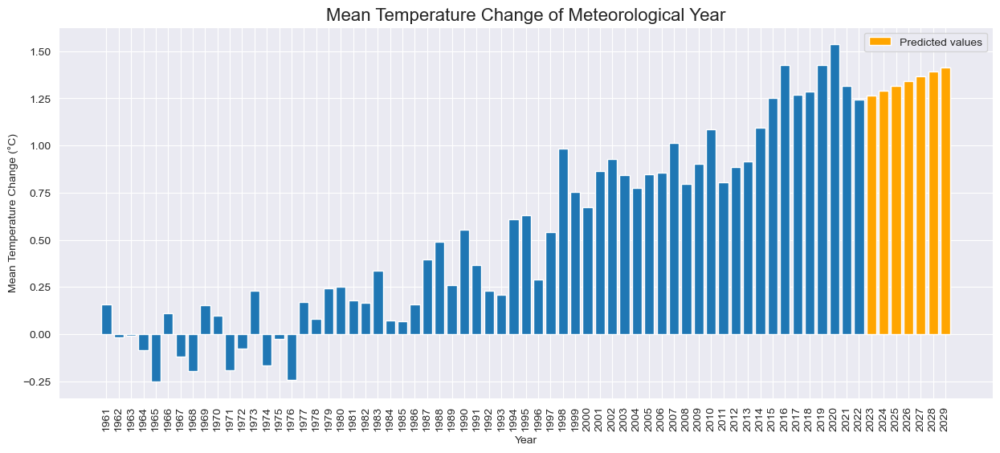

In [35]:
# create a bar plot of the mean temperature change over time
plt.figure(figsize=(15, 6))
plt.bar(df2['Year'].astype(str), df2['mean_tem_change'])
plt.title('Mean Temperature Change of Meteorological Year', fontsize=16)
plt.xlabel('Year')
plt.xticks(rotation=90)
plt.ylabel('Mean Temperature Change (°C)')
plt.grid(True)
plt.bar(df2['Year'].iloc[-7:].astype(str), df2['mean_tem_change'].iloc[-7:], color='orange', label='Predicted values')
plt.legend()
plt.show()


<div style="position:relative;">
    <img src="pexels-pixabay-39553.jpg" style="width:1000px;height:200px;">
    <div style="position:absolute;top:50%;right:40%;transform:translate(-50%,-50%);z-index:1;">
        <h1 style="color:white;text-shadow: 2px 2px 4px black;"> World Monthly Atmospheric Carbon Dioxide Concentrations</h1>
    </div>
</div>

In [36]:
df = pd.read_csv("Atmospheric_CO%E2%82%82_Concentrations.csv")
df

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,Date,Value
0,1,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrations,Parts Per Million,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",1958M03,315.70
1,2,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrations,Parts Per Million,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",1958M04,317.45
2,3,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrations,Parts Per Million,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",1958M05,317.51
3,4,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrations,Parts Per Million,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",1958M06,317.24
4,5,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrations,Parts Per Million,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",1958M07,315.86
...,...,...,...,...,...,...,...,...,...,...,...,...
1539,1540,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrati...,Percent,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",2022M10,0.45
1540,1541,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrations,Parts Per Million,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",2022M11,417.51
1541,1542,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrati...,Percent,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",2022M11,0.60
1542,1543,World,NaN,WLD,Monthly Atmospheric Carbon Dioxide Concentrations,Parts Per Million,"Dr. Pieter Tans, National Oceanic and Atmosphe...",ECCA,Atmospheric Carbon Dioxide Concentrations,"Environment, Climate Change, Climate Indicator...",2022M12,418.95


In [37]:
df.isnull().sum()

ObjectId                  0
Country                   0
ISO2                   1544
ISO3                      0
Indicator                 0
Unit                      0
Source                    0
CTS_Code                  0
CTS_Name                  0
CTS_Full_Descriptor       0
Date                      0
Value                     0
dtype: int64

In [38]:
df = df.drop(['ObjectId','ISO2','ISO3','Country','Indicator','Unit',
              'Source','CTS_Code','CTS_Name','CTS_Full_Descriptor'], axis=1)

In [39]:
df.describe()

,Value
count,1544.000000
mean,180.481937
std,180.016671
min,-0.100000
25%,0.450000
50%,314.005000
75%,354.365000
max,420.990000


In [40]:
# separate the Date column into Year and Month columns
df[['Year', 'Month']] = df['Date'].str.split('M', expand=True)

# drop the original Date column
df.drop('Date', axis=1, inplace=True)

# convert Year and Month columns to integers
df[['Year', 'Month']] = df[['Year', 'Month']].astype(int)

# display the resulting DataFrame
print(df.head())

    Value  Year  Month
0  315.70  1958      3
1  317.45  1958      4
2  317.51  1958      5
3  317.24  1958      6
4  315.86  1958      7


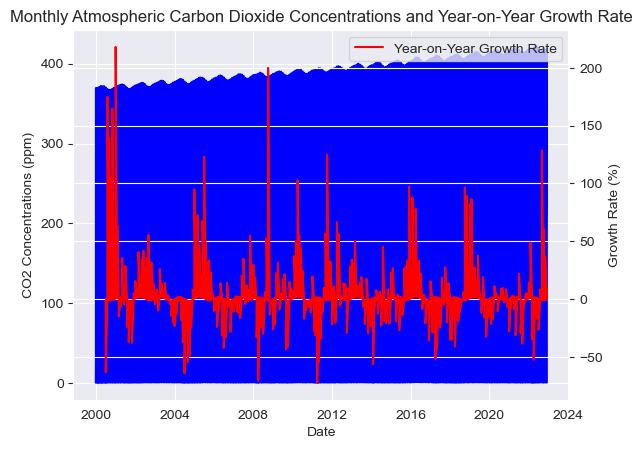

In [41]:
# convert Year and Month columns to datetime
df['Date'] = pd.to_datetime(df['Year'].astype(str) + '-' + df['Month'].astype(str)).copy()


# set the Date column as the index
df.set_index('Date', inplace=True)

# select the data from January 1st, 2000 to March 10th, 2023
df = df.loc['2000-01-01':'2023-03-10']

# calculate the year-on-year growth rate
df.loc[:, "YoY Growth Rate"] = df["Value"].pct_change(periods=12) * 100


# plot the data and the growth rate
fig, ax1 = plt.subplots()

# plot the CO2 concentrations
ax1.plot(df.index, df['Value'], color='blue', label='CO2 Concentrations')
ax1.set_xlabel('Date')
ax1.set_ylabel('CO2 Concentrations (ppm)')

# create a twin axis for the growth rate
ax2 = ax1.twinx()
ax2.plot(df.index, df['YoY Growth Rate'], color='red', label='Year-on-Year Growth Rate')
ax2.set_ylabel('Growth Rate (%)')

# add titles and legend
plt.title('Monthly Atmospheric Carbon Dioxide Concentrations and Year-on-Year Growth Rate')
plt.legend()
plt.show()

# Predicted Year-on-Year Growth Rate for the Years 2024 to 2030 Using Machine Learning (Random Forest Regressor):

Mean Absolute Error: 16.832567887327937


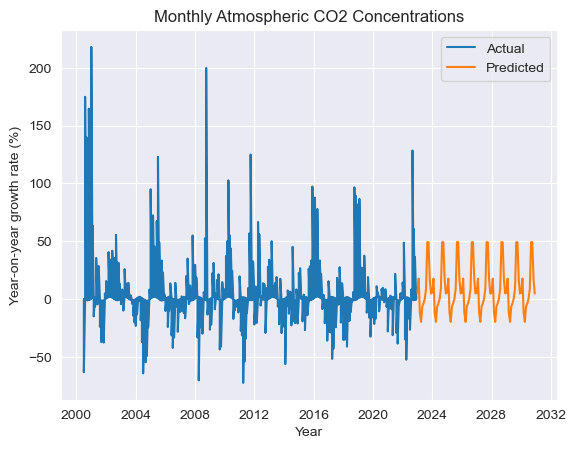

In [42]:
# Convert year and month to datetime format
df['date'] = pd.to_datetime(df[['Year', 'Month']].assign(day=1))

# Filter to only include data from 2000-01-01 to 2023-03-10
start_date = pd.to_datetime('2000-01-01')
end_date = pd.to_datetime('2023-03-10')
df = df.loc[(df['date'] >= start_date) & (df['date'] <= end_date)]

# Calculate year-on-year growth rate
df['YoY Growth Rate'] = df['Value'].pct_change(periods=12) * 100

# Filter to only include data up to 2022-12-01
df = df.loc[df['date'] <= pd.to_datetime('2022-12-01')]

# Set X and y variables for linear regression model
X = df[['Year', 'Month']].values
y = df['YoY Growth Rate'].values

# Remove any rows with missing values (NaNs)
X = X[~pd.isnull(y)]
y = y[~pd.isnull(y)]

# Split the data into training and validation sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)

# Fit model
model = model = RandomForestRegressor(n_estimators=300, max_features = 'log2',max_depth = 8 , random_state=44)
model.fit(X_train, y_train)
# Evaluate model
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error:", mae)

# Predict growth rate for the next 7 years
future_dates = pd.date_range(start='2023-01-01', end='2030-12-01', freq='MS')
future_X = [[d.year, d.month] for d in future_dates]
future_y = model.predict(future_X)

# Plot the results
plt.plot(df['date'], df['YoY Growth Rate'], label='Actual')
plt.plot(future_dates, future_y, label='Predicted')
plt.xlabel('Year')
plt.ylabel('Year-on-year growth rate (%)')
plt.title('Monthly Atmospheric CO2 Concentrations')
plt.legend()
plt.show()


<div style="position:relative;">
    <img src="pexels-ben-mack-5707565.jpg" style="width:1000px;height:200px;">
    <div style="position:absolute;top:50%;right:55%;transform:translate(-50%,-50%);z-index:1;">
        <h1 style="color:white;text-shadow: 2px 2px 4px black;">Change in Mean Sea Levels</h1>
    </div>
</div>

In [43]:
df = pd.read_csv('Change_in_Mean_Sea_Levels.csv')
df

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,Measure,Date,Value
0,1,World,NaN,WLD,Change in mean sea level: Sea level: TOPEX.Pos...,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",Andaman Sea,D12/17/1992,-10.34
1,2,World,NaN,WLD,Change in mean sea level: Sea level: TOPEX.Pos...,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",Arabian Sea,D12/17/1992,-18.46
2,3,World,NaN,WLD,Change in mean sea level: Sea level: TOPEX.Pos...,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",Atlantic Ocean,D12/17/1992,-15.41
3,4,World,NaN,WLD,Change in mean sea level: Sea level: TOPEX.Pos...,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",Baltic Sea,D12/17/1992,196.85
4,5,World,NaN,WLD,Change in mean sea level: Sea level: TOPEX.Pos...,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",Bay Bengal,D12/17/1992,3.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35599,35600,World,NaN,WLD,Change in mean sea level: Sea level: Trend,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",South China,D11/08/2022,3.76
35600,35601,World,NaN,WLD,Change in mean sea level: Sea level: Trend,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",Southern Ocean,D11/08/2022,3.22
35601,35602,World,NaN,WLD,Change in mean sea level: Sea level: Trend,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",Tropics,D11/08/2022,3.11
35602,35603,World,NaN,WLD,Change in mean sea level: Sea level: Trend,Millimeters,National Oceanic and Atmospheric Administratio...,ECCL,Change in Mean Sea Level,"Environment, Climate Change, Climate Indicator...",World,D11/08/2022,3.07


In [44]:
df.columns

Index(['ObjectId', 'Country', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source',
       'CTS_Code', 'CTS_Name', 'CTS_Full_Descriptor', 'Measure', 'Date',
       'Value'],
      dtype='object')

In [45]:
df = df.drop(['ObjectId', 'Country', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source',
              'CTS_Code', 'CTS_Name', 'CTS_Full_Descriptor'], axis=1)

In [46]:
df

,Measure,Date,Value
0,Andaman Sea,D12/17/1992,-10.34
1,Arabian Sea,D12/17/1992,-18.46
2,Atlantic Ocean,D12/17/1992,-15.41
3,Baltic Sea,D12/17/1992,196.85
4,Bay Bengal,D12/17/1992,3.27
...,...,...,...
35599,South China,D11/08/2022,3.76
35600,Southern Ocean,D11/08/2022,3.22
35601,Tropics,D11/08/2022,3.11
35602,World,D11/08/2022,3.07


In [47]:
# Re-arranging columns
new_order=[1,0,2]
df = df[df.columns[new_order]]
df

,Date,Measure,Value
0,D12/17/1992,Andaman Sea,-10.34
1,D12/17/1992,Arabian Sea,-18.46
2,D12/17/1992,Atlantic Ocean,-15.41
3,D12/17/1992,Baltic Sea,196.85
4,D12/17/1992,Bay Bengal,3.27
...,...,...,...
35599,D11/08/2022,South China,3.76
35600,D11/08/2022,Southern Ocean,3.22
35601,D11/08/2022,Tropics,3.11
35602,D11/08/2022,World,3.07


In [48]:
# remove the 'D' from the Date column
df["Date"] = df["Date"].str[1:]
df

,Date,Measure,Value
0,12/17/1992,Andaman Sea,-10.34
1,12/17/1992,Arabian Sea,-18.46
2,12/17/1992,Atlantic Ocean,-15.41
3,12/17/1992,Baltic Sea,196.85
4,12/17/1992,Bay Bengal,3.27
...,...,...,...
35599,11/08/2022,South China,3.76
35600,11/08/2022,Southern Ocean,3.22
35601,11/08/2022,Tropics,3.11
35602,11/08/2022,World,3.07


In [49]:
df.isna().sum()

Date       0
Measure    0
Value      0
dtype: int64

<AxesSubplot:ylabel='Frequency'>

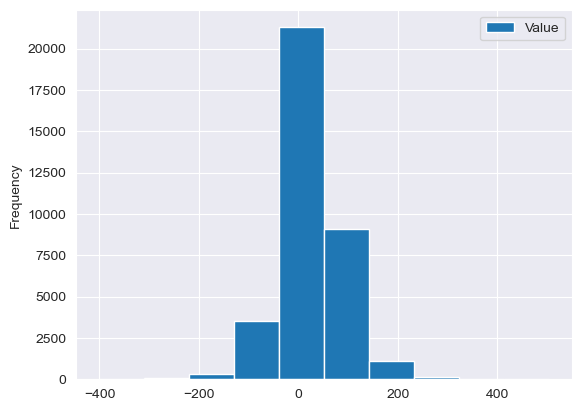

In [50]:
df.plot(kind='hist')

In [51]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,35604,3653,11/08/2022,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Measure,35604,25,Atlantic Ocean,1426,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Value,35604.0,NaN,NaN,NaN,25.983479,62.781917,-401.85,-8.5525,23.095,58.48,504.95


In [52]:
df['Measure'].unique()

array(['Andaman Sea', 'Arabian Sea', 'Atlantic Ocean', 'Baltic Sea',
       'Bay Bengal', 'Caribbean Sea', 'Gulf Mexico', 'Indian Ocean',
       'Indonesian', 'Mediterranean', 'Nino', 'North Pacific',
       'North Sea', 'Pacific Ocean', 'Persian Gulf', 'Sea Japan',
       'Sea Okhotsk', 'South China', 'Southern Ocean', 'Tropics', 'World',
       'Yellow Sea', 'Adriatic Sea', 'Bering Sea', 'North Atlantic'],
      dtype=object)

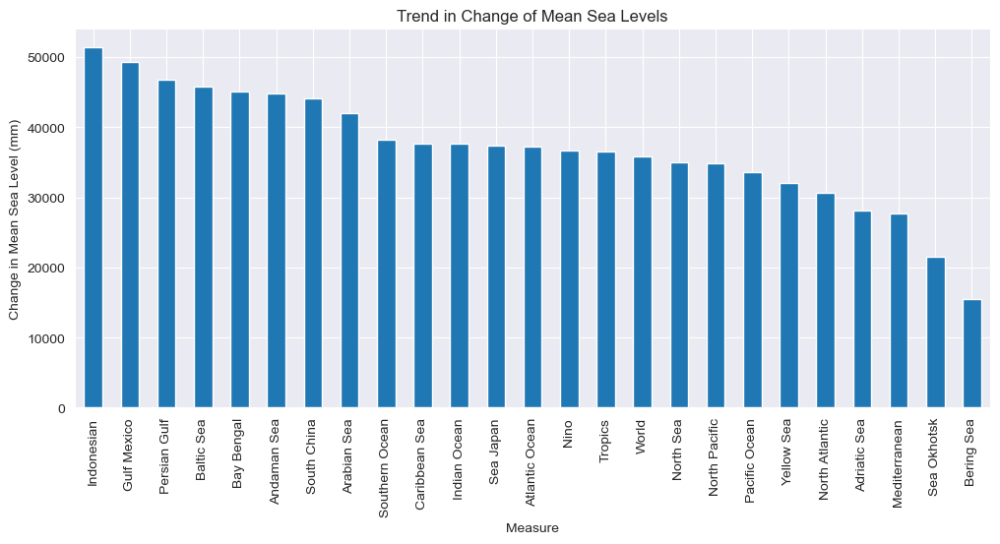

In [53]:
d = df.groupby(['Measure'])['Value'].sum()
d = d.sort_values(ascending=False)
d.plot(kind="bar", figsize=(12,5))
plt.title('Trend in Change of Mean Sea Levels')
plt.ylabel('Change in Mean Sea Level (mm)')
plt.show()

In [54]:
df.tail()

,Date,Measure,Value
35599,11/08/2022,South China,3.76
35600,11/08/2022,Southern Ocean,3.22
35601,11/08/2022,Tropics,3.11
35602,11/08/2022,World,3.07
35603,11/08/2022,Yellow Sea,2.75


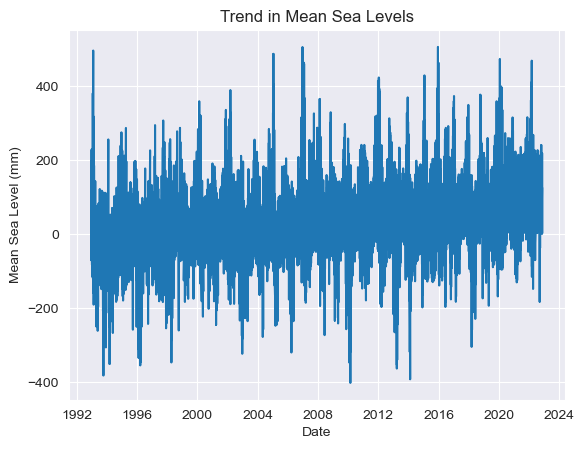

In [55]:
# convert the date column to a datetime object
df['Date'] = pd.to_datetime(df['Date'])

# create a line plot
plt.plot(df['Date'], df['Value'])

# add labels and title
plt.xlabel('Date')
plt.ylabel('Mean Sea Level (mm)')
plt.title('Trend in Mean Sea Levels')

# display the plot
plt.show()


<div style="position:relative;">
    <img src="pexels-james-frid-1097016.jpg" style="width:1000px;height:200px;">
    <div style="position:absolute;top:50%;right:60%;transform:translate(-50%,-50%);z-index:1;">
        <h1 style="color:white;text-shadow: 2px 2px 4px black;">Land Cover Accuounts</h1>
    </div>
</div>

In [56]:
df = pd.read_csv("Land_Cover_Accounts.csv")
df.tail()

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,...,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020
3041,3068,Zimbabwe,ZW,ZWE,"Shrubs and/or herbaceous vegetation, aquatic o...",1000 HA,Food and Agriculture Organization of the Unite...,ECCCV,Shrubs and/or Herbaceous Vegetation and Aquati...,"Environment, Climate Change, Climate Indicator...",...,28.1031,28.2968,28.2503,28.3201,28.3201,28.1651,27.9403,27.9093,27.9481,27.9868
3042,3069,Zimbabwe,ZW,ZWE,Sparsely natural vegetated areas,1000 HA,Food and Agriculture Organization of the Unite...,ECCCN,Sparsely Natural Vegetated Areas,"Environment, Climate Change, Climate Indicator...",...,18.2833,18.2600,18.2523,18.2290,18.2290,18.2755,18.2755,18.3375,18.3143,18.3918
3043,3070,Zimbabwe,ZW,ZWE,Terrestrial barren land,1000 HA,Food and Agriculture Organization of the Unite...,ECCCT,Terrestrial Barren Land,"Environment, Climate Change, Climate Indicator...",...,93.4780,93.3617,93.1990,92.9819,92.9742,91.9589,91.3776,90.6258,90.4476,90.3701
3044,3071,Zimbabwe,ZW,ZWE,Tree-covered areas,1000 HA,Food and Agriculture Organization of the Unite...,ECCCE,Tree-Covered Areas,"Environment, Climate Change, Climate Indicator...",...,11299.6748,11280.5596,11288.0565,11323.8674,11323.7550,11511.8472,11610.0421,11645.8119,11649.9142,11644.6889
3045,3072,Zimbabwe,ZW,ZWE,Woody crops,1000 HA,Food and Agriculture Organization of the Unite...,ECCCR,Woody Crops,"Environment, Climate Change, Climate Indicator...",...,318.1339,334.1026,334.0849,333.7528,333.7502,331.9885,330.7199,330.5210,330.5562,330.5832


In [57]:
df.columns

Index(['ObjectId', 'Country', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source',
       'CTS_Code', 'CTS_Name', 'CTS_Full_Descriptor', 'Climate_Influence',
       'F1992', 'F1993', 'F1994', 'F1995', 'F1996', 'F1997', 'F1998', 'F1999',
       'F2000', 'F2001', 'F2002', 'F2003', 'F2004', 'F2005', 'F2006', 'F2007',
       'F2008', 'F2009', 'F2010', 'F2011', 'F2012', 'F2013', 'F2014', 'F2015',
       'F2016', 'F2017', 'F2018', 'F2019', 'F2020'],
      dtype='object')

In [58]:
df=df.drop(['ObjectId', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source','CTS_Code', 'CTS_Name', 'CTS_Full_Descriptor'], axis=1)

In [59]:
df.columns = df.columns.str.replace('F', '')
df.head()

,Country,Climate_Influence,1992,1993,1994,1995,1996,1997,1998,1999,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Advanced Economies,Climate altering,95.942016,97.027517,97.030493,97.339731,97.462165,97.529704,97.691446,98.144863,...,99.903233,99.963105,99.978710,99.996285,100.0,100.010114,100.076907,100.229096,100.355972,100.394188
1,Advanced Economies excluding US,Climate altering,94.851414,96.800658,96.767106,97.090049,97.172806,97.218736,97.319020,97.916400,...,100.051718,100.104101,100.069837,100.032246,100.0,99.979035,100.007709,99.995467,100.020988,100.058737
2,Africa,Climate altering,91.590697,93.557008,93.500134,94.266184,94.532599,94.914910,95.300060,96.344889,...,98.793984,100.076777,100.086539,99.972989,100.0,99.840223,99.802754,99.725391,99.758857,99.864541
3,Americas,Climate altering,92.924554,93.023248,92.940142,94.263051,94.632936,94.902416,95.405837,96.268190,...,99.025837,99.287572,99.647269,99.784025,100.0,100.229617,100.753590,100.902233,100.997645,101.013420
4,Asia,Climate altering,100.417597,100.022963,99.578377,99.613406,99.621526,99.845212,100.065291,100.666319,...,100.133256,99.990573,99.915897,100.009021,100.0,99.723557,99.729292,99.847777,99.709031,99.730813


In [60]:
df['Climate_Influence'].unique()

array(['Climate altering', 'Climate neutral', 'Climate regulating'],
      dtype=object)

In [61]:
df.isnull().sum()

Country               0
Climate_Influence     0
1992                 10
1993                  6
1994                  6
1995                  6
1996                  6
1997                  6
1998                  6
1999                  6
2000                  4
2001                  4
2002                  4
2003                  4
2004                  4
2005                  4
2006                  2
2007                  2
2008                  2
2009                  2
2010                  2
2011                  2
2012                  0
2013                  0
2014                  0
2015                  0
2016                  0
2017                  0
2018                  3
2019                  0
2020                  0
dtype: int64

In [62]:
columns=df[['1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2018', '2019', '2020']]

for col in columns:
    df[col] = df[col].fillna(df[col].mean())

In [63]:
df.isna().sum()

Country              0
Climate_Influence    0
1992                 0
1993                 0
1994                 0
1995                 0
1996                 0
1997                 0
1998                 0
1999                 0
2000                 0
2001                 0
2002                 0
2003                 0
2004                 0
2005                 0
2006                 0
2007                 0
2008                 0
2009                 0
2010                 0
2011                 0
2012                 0
2013                 0
2014                 0
2015                 0
2016                 0
2017                 0
2018                 0
2019                 0
2020                 0
dtype: int64

In [64]:
print(df.describe())

               1992          1993          1994          1995          1996  \
count  3.046000e+03  3.046000e+03  3.046000e+03  3.046000e+03  3.046000e+03   
mean   2.049798e+04  2.069908e+04  2.069908e+04  2.069913e+04  2.069915e+04   
std    2.314624e+05  2.341002e+05  2.341656e+05  2.339702e+05  2.339050e+05   
min    0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00   
25%    2.915750e-01  4.364750e-01  4.388750e-01  4.397750e-01  4.359500e-01   
50%    4.132530e+01  4.856425e+01  4.876735e+01  4.930420e+01  4.950540e+01   
75%    5.369466e+02  5.654715e+02  5.689583e+02  5.730433e+02  5.663462e+02   
max    8.445620e+06  8.545686e+06  8.549314e+06  8.539562e+06  8.536293e+06   

               1997          1998          1999          2000          2001  \
count  3.046000e+03  3.046000e+03  3.046000e+03  3.046000e+03  3.046000e+03   
mean   2.069917e+04  2.069921e+04  2.069927e+04  2.069125e+04  2.069112e+04   
std    2.338362e+05  2.337400e+05  2.335558e+05  2.

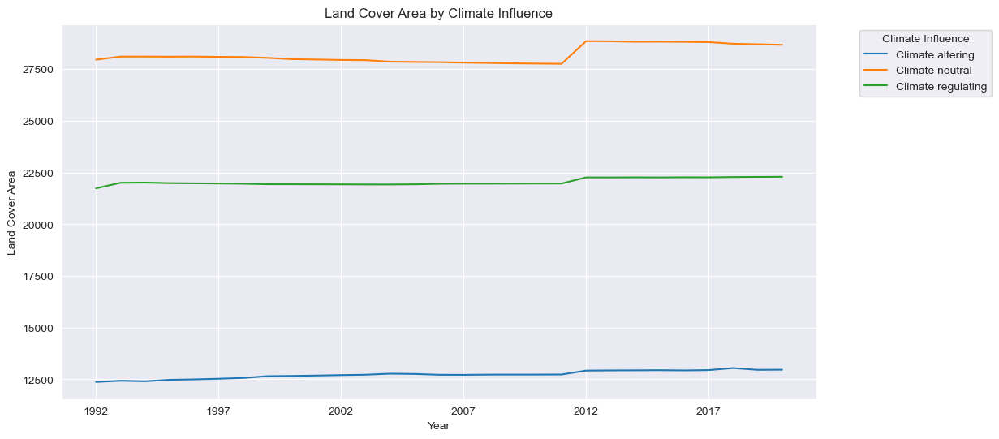

In [65]:
df_climate = df.groupby('Climate_Influence').mean().T
df_climate.plot(kind='line', figsize=(12,6))

plt.title('Land Cover Area by Climate Influence')
plt.xlabel('Year')
plt.ylabel('Land Cover Area')
plt.legend(title='Climate Influence', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

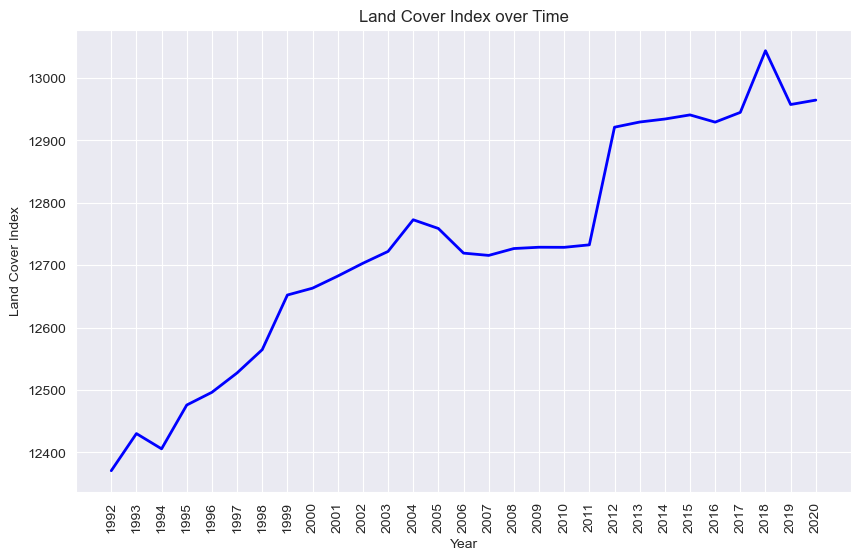

In [66]:
# Extract the relevant data for the plot
climate_altering_lc = df[df['Climate_Influence'] == 'Climate altering'].iloc[:, 2:]

# Set the figure size and plot the data
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(climate_altering_lc.mean(), linewidth=2, color='blue')

# Add axis labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Land Cover Index')
ax.set_title('Land Cover Index over Time')
plt.xticks(rotation=90)
plt.show()

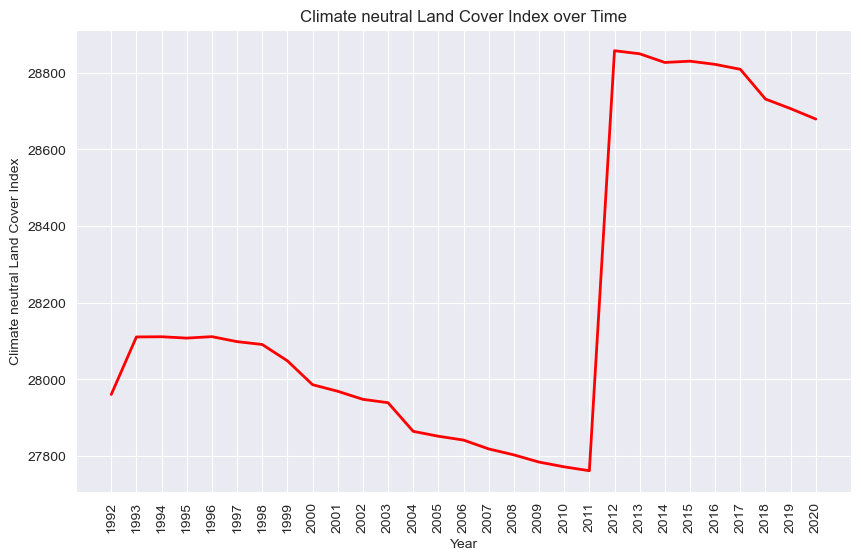

In [67]:
# Extract the relevant data for the plot
climate_altering_lc = df[df['Climate_Influence'] == 'Climate neutral'].iloc[:, 2:]

# Set the figure size and plot the data
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(climate_altering_lc.mean(), linewidth=2, color='red')

# Add axis labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Climate neutral Land Cover Index')
ax.set_title('Climate neutral Land Cover Index over Time')
plt.xticks(rotation=90)
plt.show()

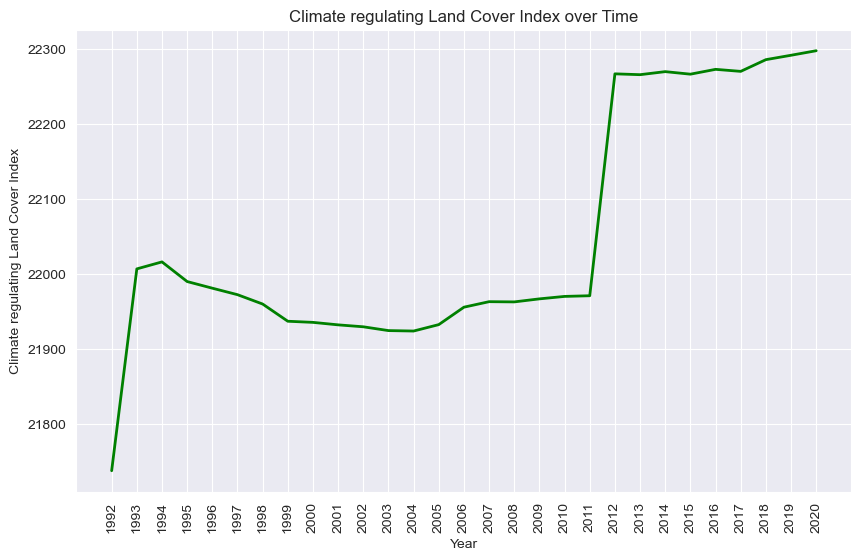

In [68]:
# Extract the relevant data for the plot
climate_altering_lc = df[df['Climate_Influence'] == 'Climate regulating'].iloc[:, 2:]

# Set the figure size and plot the data
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(climate_altering_lc.mean(), linewidth=2, color='g')

# Add axis labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Climate regulating Land Cover Index')
ax.set_title('Climate regulating Land Cover Index over Time')
plt.xticks(rotation=90)
plt.show()

In [69]:
df

,Country,Climate_Influence,1992,1993,1994,1995,1996,1997,1998,1999,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Advanced Economies,Climate altering,95.942016,97.027517,97.030493,97.339731,97.462165,97.529704,97.691446,98.144863,...,99.903233,99.963105,99.978710,99.996285,100.0000,100.010114,100.076907,100.229096,100.355972,100.394188
1,Advanced Economies excluding US,Climate altering,94.851414,96.800658,96.767106,97.090049,97.172806,97.218736,97.319020,97.916400,...,100.051718,100.104101,100.069837,100.032246,100.0000,99.979035,100.007709,99.995467,100.020988,100.058737
2,Africa,Climate altering,91.590697,93.557008,93.500134,94.266184,94.532599,94.914910,95.300060,96.344889,...,98.793984,100.076777,100.086539,99.972989,100.0000,99.840223,99.802754,99.725391,99.758857,99.864541
3,Americas,Climate altering,92.924554,93.023248,92.940142,94.263051,94.632936,94.902416,95.405837,96.268190,...,99.025837,99.287572,99.647269,99.784025,100.0000,100.229617,100.753590,100.902233,100.997645,101.013420
4,Asia,Climate altering,100.417597,100.022963,99.578377,99.613406,99.621526,99.845212,100.065291,100.666319,...,100.133256,99.990573,99.915897,100.009021,100.0000,99.723557,99.729292,99.847777,99.709031,99.730813
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3041,Zimbabwe,Climate regulating,27.583800,27.583800,27.583800,27.583800,27.607000,27.638000,27.924800,28.320100,...,28.103100,28.296800,28.250300,28.320100,28.3201,28.165100,27.940300,27.909300,27.948100,27.986800
3042,Zimbabwe,Climate neutral,17.616700,17.616700,17.616700,17.609000,17.601200,17.601200,17.601200,17.926800,...,18.283300,18.260000,18.252300,18.229000,18.2290,18.275500,18.275500,18.337500,18.314300,18.391800
3043,Zimbabwe,Climate neutral,92.749400,92.726200,92.710700,92.478200,92.416200,92.764900,93.237700,93.664000,...,93.478000,93.361700,93.199000,92.981900,92.9742,91.958900,91.377600,90.625800,90.447600,90.370100
3044,Zimbabwe,Climate regulating,11097.522600,11097.111100,11096.779700,11089.704700,11104.181400,11146.528200,11136.561500,11092.841300,...,11299.674800,11280.559600,11288.056500,11323.867400,11323.7550,11511.847200,11610.042100,11645.811900,11649.914200,11644.688900


In [70]:
df = df.T
df.rename(columns=df.iloc[0],inplace = True)
df.head()

,Advanced Economies,Advanced Economies excluding US,Africa,Americas,Asia,Emerging and Developing Countries Asia excluding China,Emerging and Developing Countries Europe,Emerging and Developing Economies,Europe,Latin America and the Caribbean,...,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe
Country,Advanced Economies,Advanced Economies excluding US,Africa,Americas,Asia,Emerging and Developing Countries Asia excludi...,Emerging and Developing Countries Europe,Emerging and Developing Economies,Europe,Latin America and the Caribbean,...,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe
Climate_Influence,Climate altering,Climate altering,Climate altering,Climate altering,Climate altering,Climate altering,Climate altering,Climate altering,Climate altering,Climate altering,...,Climate altering,Climate regulating,Climate regulating,Climate regulating,Climate regulating,Climate regulating,Climate neutral,Climate neutral,Climate regulating,Climate regulating
1992,95.942016,94.851414,91.590697,92.924554,100.417597,103.472847,97.77401,96.912455,96.805885,89.154192,...,12531.0949,437.6747,0.0,0.0,11687.4797,27.5838,17.6167,92.7494,11097.5226,419.1002
1993,97.027517,96.800658,93.557008,93.023248,100.022963,103.079231,97.782699,96.894694,97.821424,89.335095,...,12536.4058,437.6747,0.0,0.0,11687.0057,27.5838,17.6167,92.7262,11097.1111,413.7428
1994,97.030493,96.767106,93.500134,92.940142,99.578377,102.442143,97.723051,96.645627,97.760361,89.15509,...,12545.4242,437.6747,0.0,0.0,11686.6108,27.5838,17.6167,92.7107,11096.7797,404.6911


In [71]:
df = df.drop(df.index[[0, 1]])
df=df.reset_index()
df.head()

,index,Advanced Economies,Advanced Economies excluding US,Africa,Americas,Asia,Emerging and Developing Countries Asia excluding China,Emerging and Developing Countries Europe,Emerging and Developing Economies,Europe,...,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe
0,1992,95.942016,94.851414,91.590697,92.924554,100.417597,103.472847,97.77401,96.912455,96.805885,...,12531.0949,437.6747,0.0,0.0,11687.4797,27.5838,17.6167,92.7494,11097.5226,419.1002
1,1993,97.027517,96.800658,93.557008,93.023248,100.022963,103.079231,97.782699,96.894694,97.821424,...,12536.4058,437.6747,0.0,0.0,11687.0057,27.5838,17.6167,92.7262,11097.1111,413.7428
2,1994,97.030493,96.767106,93.500134,92.940142,99.578377,102.442143,97.723051,96.645627,97.760361,...,12545.4242,437.6747,0.0,0.0,11686.6108,27.5838,17.6167,92.7107,11096.7797,404.6911
3,1995,97.339731,97.090049,94.266184,94.263051,99.613406,102.524806,97.902147,97.236991,97.966793,...,12556.4931,437.9925,0.0,0.0,11683.7507,27.5838,17.609,92.4782,11089.7047,403.7458
4,1996,97.462165,97.172806,94.532599,94.632936,99.621526,102.434606,97.937702,97.405669,98.028177,...,12594.4442,440.2324,0.0,0.0,11663.2736,27.607,17.6012,92.4162,11104.1814,370.4248


In [72]:
df.rename(columns={'index':'Year'}, inplace=True)
df.tail()

,Year,Advanced Economies,Advanced Economies excluding US,Africa,Americas,Asia,Emerging and Developing Countries Asia excluding China,Emerging and Developing Countries Europe,Emerging and Developing Economies,Europe,...,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe
24,2016,100.010114,99.979035,99.840223,100.229617,99.723557,99.728759,99.809072,99.87877,99.853515,...,13279.5391,438.5273,0.0,0.0,11114.6325,28.1651,18.2755,91.9589,11511.8472,331.9885
25,2017,100.076907,100.007709,99.802754,100.75359,99.729292,99.662135,99.777871,100.01416,99.822405,...,13228.796,447.014,0.0,0.0,11060.809,27.9403,18.2755,91.3776,11610.0421,330.7199
26,2018,100.229096,99.995467,99.725391,100.902233,99.847777,99.700951,100.01269,100.086244,99.952627,...,13220.8388,447.386,0.0,0.0,11032.3754,27.9093,18.3375,90.6258,11645.8119,330.521
27,2019,100.355972,100.020988,99.758857,100.997645,99.709031,99.406371,100.204282,100.067132,100.091899,...,13222.2475,447.4015,0.0,0.0,11023.9831,27.9481,18.3143,90.4476,11649.9142,330.5562
28,2020,100.394188,100.058737,99.864541,101.01342,99.730813,99.386684,100.293015,100.116981,100.164712,...,13223.3273,447.2233,0.0,0.0,11018.834,27.9868,18.3918,90.3701,11644.6889,330.5832


In [73]:
df.dtypes

Year                               object
Advanced Economies                 object
Advanced Economies excluding US    object
Africa                             object
Americas                           object
                                    ...  
Zimbabwe                           object
Zimbabwe                           object
Zimbabwe                           object
Zimbabwe                           object
Zimbabwe                           object
Length: 3047, dtype: object

In [74]:
df=df[1:].astype(float)
df['Year'] = df['Year'].astype(int)

In [75]:
df.corr()

,Year,Advanced Economies,Advanced Economies excluding US,Africa,Americas,Asia,Emerging and Developing Countries Asia excluding China,Emerging and Developing Countries Europe,Emerging and Developing Economies,Europe,...,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe,Zimbabwe
Year,1.000000,0.918210,0.861089,0.938837,0.978990,-0.231147,-0.958952,0.924259,0.817075,0.897495,...,0.828476,0.494830,NaN,NaN,-0.975343,0.136685,0.900239,-0.465932,0.873669,-0.822692
Advanced Economies,0.918210,1.000000,0.989919,0.982584,0.964114,0.154598,-0.813655,0.945371,0.968779,0.974081,...,0.953149,0.324162,NaN,NaN,-0.950023,0.464099,0.978254,-0.111837,0.663415,-0.894657
Advanced Economies excluding US,0.861089,0.989919,1.000000,0.966986,0.923385,0.254819,-0.750710,0.923172,0.979004,0.970016,...,0.971852,0.214301,NaN,NaN,-0.902882,0.546309,0.970670,0.017757,0.563561,-0.886971
Africa,0.938837,0.982584,0.966986,1.000000,0.975567,0.055107,-0.852451,0.950011,0.941137,0.965892,...,0.945237,0.290788,NaN,NaN,-0.940043,0.406608,0.958342,-0.152056,0.676541,-0.895920
Americas,0.978990,0.964114,0.923385,0.975567,1.000000,-0.061397,-0.896225,0.935147,0.904817,0.931638,...,0.884030,0.456970,NaN,NaN,-0.978746,0.281358,0.937989,-0.323283,0.799871,-0.882589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zimbabwe,0.136685,0.464099,0.546309,0.406608,0.281358,0.796671,0.029795,0.361197,0.607646,0.456488,...,0.563505,-0.247892,NaN,NaN,-0.226213,1.000000,0.443544,0.687120,-0.254394,-0.464637
Zimbabwe,0.900239,0.978254,0.970670,0.958342,0.937989,0.148585,-0.815086,0.947952,0.953537,0.970011,...,0.955738,0.277448,NaN,NaN,-0.931917,0.443544,1.000000,-0.102755,0.647405,-0.888456
Zimbabwe,-0.465932,-0.111837,0.017757,-0.152056,-0.323283,0.823743,0.548563,-0.180630,0.084902,-0.067664,...,0.084871,-0.729851,NaN,NaN,0.390682,0.687120,-0.102755,1.000000,-0.793142,0.025002
Zimbabwe,0.873669,0.663415,0.563561,0.676541,0.799871,-0.485918,-0.861373,0.673210,0.510443,0.609193,...,0.479687,0.756597,NaN,NaN,-0.859438,-0.254394,0.647405,-0.793142,1.000000,-0.544412


In [76]:
df[['Year','Africa','Europe']]

,Year,Africa,Africa,Africa,Africa,Europe,Europe,Europe,Europe
1,1993,93.557008,310332.6639,9.048297e+05,1.510417e+06,97.821424,366675.8326,177423.8813,1.730077e+06
2,1994,93.500134,310144.0400,9.048229e+05,1.510612e+06,97.760361,366446.7167,177401.1974,1.730328e+06
3,1995,94.266184,312685.0322,9.049698e+05,1.507924e+06,97.966793,367220.4771,176602.7053,1.730352e+06
4,1996,94.532599,313568.7344,9.048026e+05,1.507208e+06,98.028177,367450.5599,176678.6828,1.730046e+06
5,1997,94.914910,314836.9413,9.045019e+05,1.506241e+06,98.116073,367779.9964,176507.4059,1.729888e+06
6,1998,95.300060,316114.3453,9.043688e+05,1.505095e+06,98.174082,367997.6887,176383.6895,1.729795e+06
7,1999,96.344889,319580.1063,9.041272e+05,1.501871e+06,98.403896,368858.9607,175805.6174,1.729511e+06
8,2000,96.826027,321176.0258,9.038660e+05,1.500536e+06,99.113789,372063.1811,174475.7465,1.730962e+06
9,2001,97.134484,322199.2296,9.035342e+05,1.499845e+06,99.139415,372159.4918,173808.9355,1.731533e+06
10,2002,97.569549,323642.3158,9.032596e+05,1.498676e+06,99.288441,372718.8236,173405.3343,1.731377e+06


# Machine Learning Using (Linear Regression)

In [94]:
def model(X, y):
    """
    Perform linear regression on input data.

    Args:
        X (array-like): Input data.
        y (array-like): Target data.

    Returns:
        None
    """
    # Create a linear regression model
    model = LinearRegression()
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)
    X_train = np.array(X_train).reshape(-1, 1)
    X_test = np.array(X_test).reshape(-1, 1)
    # Train the model on the training set
    model.fit(X_train, y_train)
    # Use the trained model to make predictions on the training set
    y_pred = model.predict(X_train)
    # Print the model's coefficient of determination, intercept,slope etc
    print('Coefficient of determination(R-Squared):', model.score(X_train, y_train))
    print('Intercept:', model.intercept_)
    print('Slope:', model.coef_)

## Apply Model For Some Continents

In [95]:
model(df['Year'],df['Africa'],)

Coefficient of determination(R-Squared): 0.8012126938652857
Intercept: [-3.86222231e+02 -4.27893095e+06 -8.84666876e+06 -8.81319874e+06]
Slope: [[2.41201055e-01]
 [2.29988598e+03]
 [4.87809850e+03]
 [5.16162659e+03]]


In [79]:
model(df['Year'], df['Americas'])

Coefficient of determination(R-Squared): 0.8390308506461659
Intercept: [-4.73812080e+02 -2.27755488e+06  4.69652646e+05  5.75443317e+06]
Slope: [[ 2.84848538e-01]
 [ 1.36921829e+03]
 [-8.16645016e+01]
 [-1.28704545e+03]]


In [80]:
model(df['Year'], df['Europe'])

Coefficient of determination(R-Squared): 0.8567743660359022
Intercept: [-8.00298690e+01 -5.17569704e+05  8.80868125e+05  5.91585425e+05]
Slope: [[ 8.93684462e-02]
 [ 4.44057973e+02]
 [-3.53147151e+02]
 [ 5.70409919e+02]]


# Appy Model For Some Countries

In [81]:
model(df['Year'], df['Nigeria'])

Coefficient of determination(R-Squared): 0.7806552894925542
Intercept: [-2.73207681e+02 -3.28937896e+04  4.06262084e+04 -8.17673357e+04
 -2.17199147e+03  3.49373124e+03  0.00000000e+00  4.75380083e+05
 -3.40892188e+02 -2.35337310e+03  2.47994796e+02 -1.73935464e+05
 -1.34835343e+05]
Slope: [[ 1.85048631e-01]
 [ 1.65696046e+01]
 [-1.64646113e+01]
 [ 6.10914264e+01]
 [ 1.55671029e+00]
 [-1.30867110e+00]
 [-0.00000000e+00]
 [-2.30502614e+02]
 [ 3.61721500e-01]
 [ 1.20068395e+00]
 [-1.14872961e-01]
 [ 9.67879160e+01]
 [ 7.08293658e+01]]


In [82]:
model(df['Year'], df['Japan'])

Coefficient of determination(R-Squared): 0.8104809379274852
Intercept: [-3.87800401e+02 -7.77106604e+04 -8.02978588e+03  4.46757736e+04
  1.98584606e+03 -9.10005051e+00  0.00000000e+00 -8.17648230e+02
 -7.00361491e+02  3.56032387e+02  8.76203181e+01  6.23533952e+04
  1.52546304e+04]
Slope: [[ 2.42297454e-01]
 [ 3.93998516e+01]
 [ 4.67332301e+00]
 [-1.87592857e+01]
 [-5.15397457e-01]
 [ 5.97776721e-03]
 [-0.00000000e+00]
 [ 8.46666721e-01]
 [ 3.87177943e-01]
 [-1.74476648e-01]
 [-4.18705446e-02]
 [-1.84936864e+01]
 [-7.33507394e+00]]


In [83]:
model(df['Year'], df['Uruguay'])

Coefficient of determination(R-Squared): 0.8502597098959973
Intercept: [ 5.22264078e+02 -1.63595483e+03  1.69627437e+04  1.60105246e+04
 -9.28053296e+02  0.00000000e+00  0.00000000e+00  1.48093405e+04
  1.45033855e+03 -1.30797389e+01 -1.30002612e+01 -3.31469080e+04
  4.33499587e+03]
Slope: [[-2.09664096e-01]
 [ 8.33596347e-01]
 [-2.69738873e+00]
 [-6.60430448e+00]
 [ 6.85083644e-01]
 [-0.00000000e+00]
 [-0.00000000e+00]
 [-7.01965679e+00]
 [-5.82234541e-01]
 [ 7.08159109e-03]
 [ 8.15431201e-03]
 [ 1.74953786e+01]
 [-2.12586384e+00]]


In [84]:
model(df['Year'], df['Taiwan Province of China'])

Coefficient of determination(R-Squared): 0.8344252204629421
Intercept: [-6.55383118e+02 -9.19789742e+03 -1.20327930e+03  3.49337864e+03
  6.32723927e+02 -7.45944549e+00  0.00000000e+00 -1.15240379e+02
  5.34869184e+02 -2.78520861e+01  0.00000000e+00  7.08536150e+03
  2.43438984e+03]
Slope: [[ 0.37459222]
 [ 4.63141749]
 [ 0.64840438]
 [-1.37091719]
 [-0.28277999]
 [ 0.01701901]
 [-0.        ]
 [ 0.073128  ]
 [-0.24598554]
 [ 0.01605107]
 [-0.        ]
 [-2.40548246]
 [-1.08122333]]
